In [17]:
import os
import mlflow
import numpy as np
import pandas as pd

from math import sqrt
from joblib import delayed
from joblib import Parallel

from warnings import catch_warnings
from warnings import filterwarnings
from multiprocessing import cpu_count
from sklearn.metrics import mean_squared_error
from statsmodels.tsa.statespace.sarimax import SARIMAX

import matplotlib.pyplot as plt
import seaborn as sns; sns.set()
from matplotlib import pyplot
import matplotlib.dates as mdates

from pathlib import Path
from functools import reduce
from datetime import datetime

import random
from scipy.stats import ttest_ind
import statsmodels.api as sm
from statsmodels.formula.api import ols
from sklearn.linear_model import LinearRegression, RidgeCV, Ridge, LogisticRegression
from sklearn.preprocessing import MinMaxScaler
from regressors import stats
from mlxtend.feature_selection import SequentialFeatureSelector as sfs

## Load data 

In [42]:
df = pd.read_csv('./crisis_var_pca.csv', converters={'ags2': str, 'ags5': str} )
df['date'] = pd.to_datetime(df['date'], format = '%Y-%m-%d')
df['error'] = df['ground_truth'] - df['pred']
# fix ags5 missing 0 
df['ags5'] = np.where(df.ags5.str.len() ==4, '0' + df['ags5'], df['ags5'])
df

,date,ground_truth,pred,ags5,error
0,2018-12-01,7.3,7.566702,01001,-0.266702
1,2019-01-01,8.2,8.038843,01001,0.161157
2,2019-02-01,7.8,8.022765,01001,-0.222765
3,2019-03-01,7.8,7.754631,01001,0.045369
4,2019-04-01,7.6,7.502805,01001,0.097195
...,...,...,...,...,...
12025,2021-01-01,7.3,7.479328,16077,-0.179328
12026,2021-02-01,7.3,7.435923,16077,-0.135923
12027,2021-03-01,7.2,7.046545,16077,0.153455
12028,2021-04-01,6.9,6.780956,16077,0.119044


In [43]:
df2 = pd.read_csv('./../../data/final_dfs/for_modeling/df_final_stationery.csv', converters={'ags2': str, 'ags5': str} )
#df2 = df2[['ags2', 'kreis','ags5','cluster']]
# fix ags5 missing 0 
df2['ags5'] = np.where(df2.ags5.str.len() ==4, '0' + df2['ags5'], df2['ags5'])
df = pd.merge(df, df2, left_on = 'ags5', right_on = 'ags5')
df

,date,ground_truth,pred,ags5,error,cluster,kreis,ags2,supermarkets_population,supermarkets_average_distance,...,room_type_location,district_settlement_structure,type_of_settlement_structure,urban_/_rural,metropolitan_region,metropolitan_area,east_west,border_proximity,support_area_status,eligible_area
0,2018-12-01,7.3,7.566702,01001,-0.266702,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
1,2019-01-01,8.2,8.038843,01001,0.161157,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
2,2019-02-01,7.8,8.022765,01001,-0.222765,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
3,2019-03-01,7.8,7.754631,01001,0.045369,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
4,2019-04-01,7.6,7.502805,01001,0.097195,0,"Flensburg, Stadt",01,92,500,...,2,4,3,2,99,99,1,1,C,1
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
12025,2021-01-01,7.3,7.479328,16077,-0.179328,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
12026,2021-02-01,7.3,7.435923,16077,-0.135923,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
12027,2021-03-01,7.2,7.046545,16077,0.153455,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1
12028,2021-04-01,6.9,6.780956,16077,0.119044,0,Altenburger Land,16,62,1458,...,3,3,2,2,7,99,2,0,C*,1


In [32]:
df.to_csv('./../../data/error_VAR_with_str.csv')

## Plot ground truth vs pred

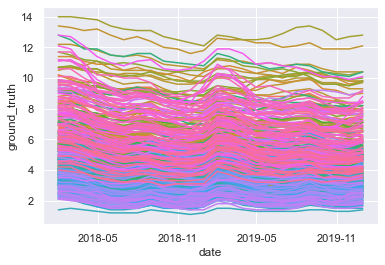

In [33]:
g = sns.lineplot(data=df, x="date", y="ground_truth",  hue="ags5")
g.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
g.legend_.remove()

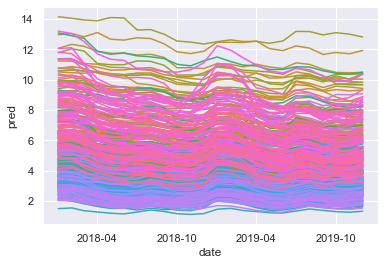

In [22]:
g = sns.lineplot(data=df, x="date", y="pred",  hue="ags5")
g.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
g.legend_.remove()

## Look into mean errors


In [44]:
df_mean = df.groupby(['ags2', 'kreis','ags5']).mean()
df_mean  

ground_truth      pred     error  cluster  \
ags2 kreis                  ags5                                               
01   Dithmarschen           01051      5.926667  5.888471  0.038196        0   
     Flensburg, Stadt       01001      8.580000  8.347893  0.232107        0   
     Herzogtum Lauenburg    01053      5.156667  5.138586  0.018081        0   
     Kiel, Landeshauptstadt 01002      8.110000  8.065461  0.044539        2   
     Lübeck, Hansestadt     01003      7.870000  7.729069  0.140931        2   
...                                         ...       ...       ...      ...   
16   Sömmerda               16068      6.156667  5.873520  0.283147        0   
     Unstrut-Hainich-Kreis  16064      7.256667  7.197220  0.059447        0   
     Wartburgkreis          16063      4.553333  4.491512  0.061821        0   
     Weimar                 16055      6.193333  5.959199  0.234134        0   
     Weimarer Land          16071      4.390000  4.278830  0.111170        0   

                                   supermarkets_population  \
ags2 kreis                  ags5                             
01   Dithmarschen           01051                       51   
     Flensburg, Stadt       01001                       92   
     Herzogtum Lauenburg    01053                       63   
     Kiel, Landeshauptstadt 01002                       92   
     Lübeck, Hansestadt     01003                       90   
...                                                    ...   
16   Sömmerda               16068                       52   
     Unstrut-Hainich-Kreis  16064                       65   
     Wartburgkreis          16063                       55   
     Weimar                 16055                       90   
     Weimarer Land          16071                       48   

                                   supermarkets_average_distance  \
ags2 kreis                  ags5                                   
01   Dithmarschen           01051                           1864   
     Flensburg, Stadt       01001                            500   
     Herzogtum Lauenburg    01053                           1545   
     Kiel, Landeshauptstadt 01002                            460   
     Lübeck, Hansestadt     01003                            532   
...                                                          ...   
16   Sömmerda               16068                           1862   
     Unstrut-Hainich-Kreis  16064                           1428   
     Wartburgkreis          16063                           1566   
     Weimar                 16055                            503   
     Weimarer Land          16071                           1770   

                                   public_transport_availability  \
ags2 kreis                  ags5                                   
01   Dithmarschen           01051                             35   
     Flensburg, Stadt       01001                             35   
     Herzogtum Lauenburg    01053                             37   
     Kiel, Landeshauptstadt 01002                             37   
     Lübeck, Hansestadt     01003                             37   
...                                                          ...   
16   Sömmerda               16068                             36   
     Unstrut-Hainich-Kreis  16064                             31   
     Wartburgkreis          16063                             27   
     Weimar                 16055                             39   
     Weimarer Land          16071                             37   

                                   average_distance_bus_stop  \
ags2 kreis                  ags5                               
01   Dithmarschen           01051                        448   
     Flensburg, Stadt       01001                        240   
     Herzogtum Lauenburg    01053                        468   
     Kiel, Landeshauptstadt 01002                        268   
     Lübeck, Hansestadt     01003

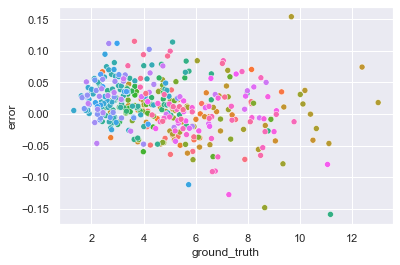

In [35]:
g = sns.scatterplot(data=df_mean, x="ground_truth", y="error",  hue="ags5")
g.legend_.remove()

In [45]:
df_mean["urban_/_rural"] = np.where(df_mean["urban_/_rural"]==1, 'urban', 'rural')
df_mean['eligible_area'] = np.where(df_mean['eligible_area']==1, 'eligible_area', 'not_eligible_area')
df_mean['east_west'] = np.where(df_mean['east_west']==1, 'west', 'east')
df_mean = df_mean.rename(columns={'urban_/_rural': 'urban_rural'})
df_mean = df_mean.reset_index()
df_mean

,ags2,kreis,ags5,ground_truth,pred,error,cluster,supermarkets_population,supermarkets_average_distance,public_transport_availability,...,settlement_structure_type_of_labor_market_region,room_type_location,district_settlement_structure,type_of_settlement_structure,urban_rural,metropolitan_region,metropolitan_area,east_west,border_proximity,eligible_area
0,01,Dithmarschen,01051,5.926667,5.888471,0.038196,0,51,1864,35,...,3,4,4,3,rural,5,99,west,0,eligible_area
1,01,"Flensburg, Stadt",01001,8.580000,8.347893,0.232107,0,92,500,35,...,3,2,4,3,rural,99,99,west,1,eligible_area
2,01,Herzogtum Lauenburg,01053,5.156667,5.138586,0.018081,0,63,1545,37,...,2,2,3,2,rural,5,99,west,0,eligible_area
3,01,"Kiel, Landeshauptstadt",01002,8.110000,8.065461,0.044539,2,92,460,37,...,1,2,1,2,urban,99,99,west,0,eligible_area
4,01,"Lübeck, Hansestadt",01003,7.870000,7.729069,0.140931,2,90,532,37,...,1,1,1,2,urban,5,99,west,0,eligible_area
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
396,16,Sömmerda,16068,6.156667,5.873520,0.283147,0,52,1862,36,...,1,3,4,2,rural,99,99,east,0,eligible_area
397,16,Unstrut-Hainich-Kreis,16064,7.256667,7.197220,0.059447,0,65,1428,31,...,3,3,4,3,rural,99,99,east,0,eligible_area
398,16,Wartburgkreis,16063,4.553333,4.491512,0.061821,0,55,1566,27,...,3,3,4,3,rural,99,99,east,0,eligible_area
399,16,Weimar,16055,6.193333,5.959199,0.234134,0,90,503,39,...,1,2,2,2,urban,99,99,east,0,eligible_area


Text(0, 0.5, 'region error')

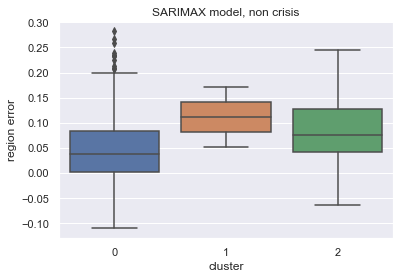

In [46]:
ax = sns.boxplot(x="cluster", y="error", data=df_mean)
ax.set_title("SARIMAX model, non crisis")
ax.set_ylabel("region error")



In [40]:
sns.boxplot(x="ags2", y="error", data=df_mean)

ValueError: Could not interpret input 'ags2'

In [348]:
df_all_kreis = df
df_all_kreis = df_all_kreis[['date','ags5','2019_population', 'pred','ground_truth']]
df_all_kreis['pred'] = df_all_kreis['pred']*df_all_kreis['2019_population']
df_all_kreis['ground_truth'] = df_all_kreis['ground_truth']*df_all_kreis['2019_population']
df_all_kreis = df_all_kreis.groupby(['date']).sum()
df_all_kreis['pred'] = df_all_kreis['pred']/df_all_kreis['2019_population']
df_all_kreis['ground_truth'] = df_all_kreis['ground_truth']/df_all_kreis['2019_population']
df_all_kreis = df_all_kreis[['ground_truth','pred']]
df_all_kreis['date'] = df_all_kreis.index
df_all_kreis['date'] = pd.to_datetime(df_all_kreis['date'], format = '%Y-%m-%d')
df_all_kreis['error'] = (df_all_kreis['ground_truth'] - df_all_kreis['pred'])/ df_all_kreis['pred']

<ipython-input-348-c797e4a87de5>:3: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_kreis['pred'] = df_all_kreis['pred']*df_all_kreis['2019_population']
<ipython-input-348-c797e4a87de5>:4: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  df_all_kreis['ground_truth'] = df_all_kreis['ground_truth']*df_all_kreis['2019_population']


Text(0.5, 1.0, 'errors all Kreise')

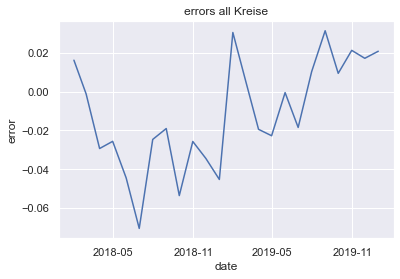

In [349]:
g = sns.lineplot(data=df_all_kreis, x="date", y="error")
g.xaxis.set_major_locator(mdates.MonthLocator(interval=6))
g.set_title('errors all Kreise')

### Sequential Feature Selector


In [350]:
df_mean['east_west'] = df_mean['east_west'].astype(str)
df_mean['eligible_area'] =df_mean['eligible_area'].astype(str)
df_mean['cluster'] = df_mean['cluster'].astype(str)
df_mean['urban_rural'] = df_mean['urban_rural'].astype(str)

X = df_mean.drop(['kreis','pred','error','ground_truth','Unnamed:_0'], axis=1)
Y = np.log(df_mean['error'])

X = pd.get_dummies(data=X, drop_first=True)

regr = LinearRegression()
sfs1 = sfs(regr, k_features = 10,forward=True, floating=False, scoring='r2', cv=5)
sfs1.fit(X, Y)

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/pandas/core/arraylike.py:358: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)
/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/v

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/p

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/p

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py:615: FitFailedWarning: Estimator fit failed. The score on this train-test partition for these parameters will be set to nan. Details: 
Traceback (most recent call last):
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/model_selection/_validation.py", line 598, in _fit_and_score
    estimator.fit(X_train, y_train, **fit_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/linear_model/_base.py", line 518, in fit
    X, y = self._validate_data(X, y, accept_sparse=accept_sparse,
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/base.py", line 433, in _validate_data
    X, y = check_X_y(X, y, **check_params)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklearn/utils/validation.py", line 63, in inner_f
    return f(*args, **kwargs)
  File "/Users/amitsasson/venv/DSSGx/lib/python3.8/site-packages/sklear

IOPub data rate exceeded.
The notebook server will temporarily stop sending output
to the client in order to avoid crashing it.
To change this limit, set the config variable
`--NotebookApp.iopub_data_rate_limit`.

Current values:
NotebookApp.iopub_data_rate_limit=1000000.0 (bytes/sec)
NotebookApp.rate_limit_window=3.0 (secs)



In [351]:
summary_table_select = pd.DataFrame.from_dict(sfs1.get_metric_dict()).T
summary_table_select

,feature_idx,cv_scores,avg_score,feature_names,ci_bound,std_dev,std_err
1,"(0,)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population,)",NaN,NaN,NaN
2,"(0, 1)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
3,"(0, 1, 2)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
4,"(0, 1, 2, 3)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
5,"(0, 1, 2, 3, 4)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
6,"(0, 1, 2, 3, 4, 5)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
7,"(0, 1, 2, 3, 4, 5, 6)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
8,"(0, 1, 2, 3, 4, 5, 6, 7)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
9,"(0, 1, 2, 3, 4, 5, 6, 7, 8)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN
10,"(0, 1, 2, 3, 4, 5, 6, 7, 8, 9)","[nan, nan, nan, nan, nan]",NaN,"(supermarkets_population, supermarkets_average...",NaN,NaN,NaN


In [352]:
list(summary_table_select['feature_names'])[:5]

[('supermarkets_population',),
 ('supermarkets_population', 'supermarkets_average_distance'),
 ('supermarkets_population',
  'supermarkets_average_distance',
  'public_transport_availability'),
 ('supermarkets_population',
  'supermarkets_average_distance',
  'public_transport_availability',
  'average_distance_bus_stop'),
 ('supermarkets_population',
  'supermarkets_average_distance',
  'public_transport_availability',
  'average_distance_bus_stop',
  'average_distance_train_station')]

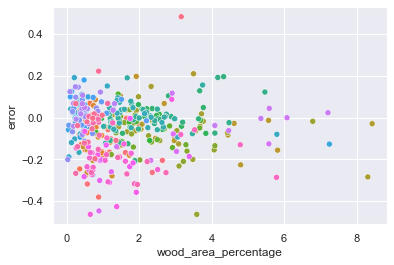

In [353]:
g = sns.scatterplot(data=df_mean, x="wood_area_percentage", y="error",  hue="ags5")
g.legend_.remove()

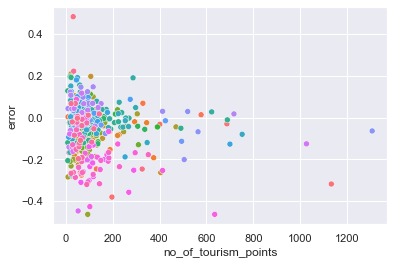

In [354]:
g = sns.scatterplot(data=df_mean, x="no_of_tourism_points", y="error",  hue="ags5")
g.legend_.remove()

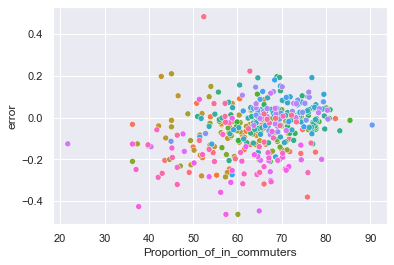

In [355]:
g = sns.scatterplot(data=df_mean, x="Proportion_of_in_commuters", y="error",  hue="ags5")
g.legend_.remove()

<AxesSubplot:xlabel='border_proximity', ylabel='error'>

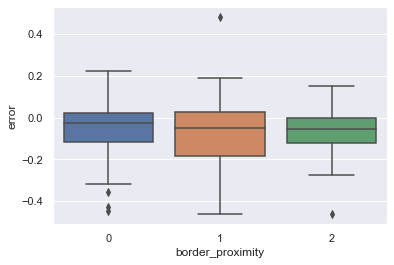

In [356]:
g = sns.boxplot(data=df_mean, x="border_proximity", y="error")
g